# Data-integrasjon oppgave
#### Vi skal lage transformasjon og sammenstilling av to eller flere kjente og åpne datasett. Vi skal så presentere en analyse av disse. 

Det kan være mye spennende å se på når det kommer til populasjonsdata.
Vi tar for oss (i første omgang) et datasett fra SSB som gir oss antall mennesker i norge (både norske og innvandrere) i perioden $1864-2023$ i aldersgruppen $0$ til $105+$ år. https://www.ssb.no/statbank/table/10211/


In [1]:
#############################################################
# Starter med å importere nyttige biblioteker 
#############################################################
# api connectors
import requests
from http.client import HTTPSConnection
#json -> pandas -> numpy
import json
import pandas as pd
import numpy as np
#plotting
from matplotlib import pyplot as plt
import matplotlib.animation as animation
#Litt bredere notebook-vindu, spesielt nice på bred skjerm 
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))


In [2]:
# Base url 
base_url = "https://www.ssb.no/statbank/sq/10082934"
#Sends a get request for data 
connection = requests.get(base_url)
print(connection.json())

{'dataset': {'dimension': {'Alder': {'label': 'alder', 'category': {'index': {'000': 0, '001': 1, '002': 2, '003': 3, '004': 4, '005': 5, '006': 6, '007': 7, '008': 8, '009': 9, '010': 10, '011': 11, '012': 12, '013': 13, '014': 14, '015': 15, '016': 16, '017': 17, '018': 18, '019': 19, '020': 20, '021': 21, '022': 22, '023': 23, '024': 24, '025': 25, '026': 26, '027': 27, '028': 28, '029': 29, '030': 30, '031': 31, '032': 32, '033': 33, '034': 34, '035': 35, '036': 36, '037': 37, '038': 38, '039': 39, '040': 40, '041': 41, '042': 42, '043': 43, '044': 44, '045': 45, '046': 46, '047': 47, '048': 48, '049': 49, '050': 50, '051': 51, '052': 52, '053': 53, '054': 54, '055': 55, '056': 56, '057': 57, '058': 58, '059': 59, '060': 60, '061': 61, '062': 62, '063': 63, '064': 64, '065': 65, '066': 66, '067': 67, '068': 68, '069': 69, '070': 70, '071': 71, '072': 72, '073': 73, '074': 74, '075': 75, '076': 76, '077': 77, '078': 78, '079': 79, '080': 80, '081': 81, '082': 82, '083': 83, '084': 8

In [3]:
data = json.loads(connection.text)
df = pd.DataFrame(data)
print(df.head())
print("\n")
print(df["dataset"]["value"])
#df = pd.read_json(connection.json())
values = np.asarray(df["dataset"]["value"])

                                                     dataset
dimension  {'Alder': {'label': 'alder', 'category': {'ind...
extension  {'px': {'infofile': 'None', 'tableid': '10211'...
label      10211: Befolkning, etter alder, år og statisti...
source                                Statistisk sentralbyrå
updated                                 2023-02-21T07:00:00Z


[36372, 38286, 38326, 37308, 41054, 39993, 41500, 40554, 42572, 46250, 45644, 45299, 46864, 48235, 50898, 49707, 46096, 48614, 50381, 49969, 51764, 50520, 47247, 47364, 45712, 46739, 47526, 48370, 48873, 50893, 52399, 53449, 54599, 54915, 57237, 55157, 53880, 54277, 55517, 56890, 57418, 56766, 58190, 56178, 54692, 57244, 57798, 55848, 57892, 56697, 59279, 59005, 60149, 61885, 61475, 62629, 63034, 62932, 61811, 60628, 58804, 59065, 58422, 58415, 60160, 58437, 58414, 59038, 58937, 59325, 55786, 58364, 61049, 60282, 56461, 66005, 62176, 60486, 59498, 55947, 52161, 52331, 48508, 48114, 46379, 46155, 44391, 43803, 40600, 40536, 3

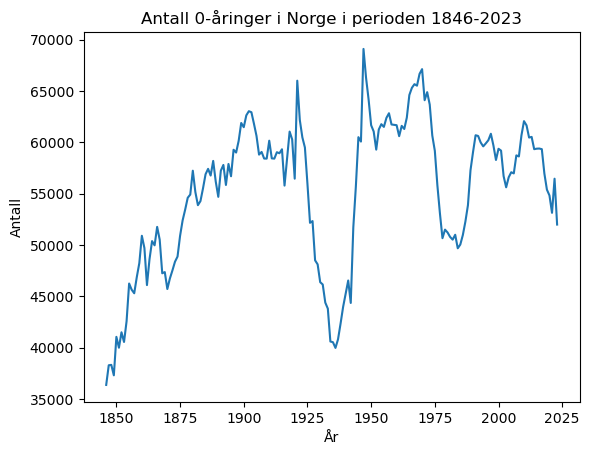

In [4]:
years = np.arange(1846, 2024)
alder = np.arange(0,106)

matrix_alder = np.reshape(values, (106,178)) ##  f(tid)|_år = antall 

plt.title("Antall 0-åringer i Norge i perioden 1846-2023")   
plt.plot(years, matrix_alder[0])
plt.xlabel("År")
plt.ylabel("Antall")
plt.show()

Ønsker å se litt nermere på periodene med lav andel $0$-åringer. 
Hva skyldes den lave andelen? Lave fødselsrater..? Økonomisk krise? Andre sosiale kriser eller nedgangstider? 

Den tydeligste nedgangen i antall 0-åringer er i perioden $1925$-$1950$, for vi også har en periode $1975$-$1990$.

Vi har også noen skarpe oppturer i antall 0-åringer. Da spesielt i perioden 1920-1925 og perioden 1945-1950. 

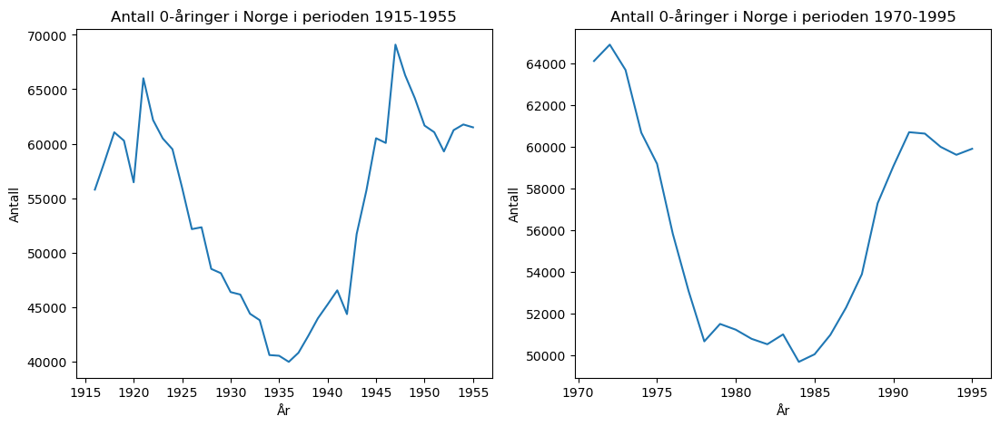

In [5]:
fig, ax = plt.subplots(1,2, figsize=(13, 5))
ax[0].set_title("Antall 0-åringer i Norge i perioden 1915-1955")   
ax[0].plot(years[70:110], matrix_alder[0][70:110])
ax[0].set_xlabel("År")
ax[0].set_ylabel("Antall")
#ax[0].show()

ax[1].set_title("Antall 0-åringer i Norge i perioden 1970-1995")   
ax[1].plot(years[125:150], matrix_alder[0][125:150])
ax[1].set_xlabel("År")
ax[1].set_ylabel("Antall")
plt.show()


Spekulasjoner: 

Den økonomiske depresjonen som ble utløst av børskrakket på Wall Street i 1929, skapte langvarig høy arbeidsløshet i Norge i 1930-årene. Den store depresjonen, også kalt den store verdenskrisen eller på norsk «de harde trettiåra», var en verdensomfattende økonomisk nedgangsperiode i første del av 1930-årene. Børskrakket i 1929 på Wall Street markerer ofte starten på depresjonen, selv om amerikansk økonomi da hadde vært i resesjon et par måneder. Start 1929, slutt 1939.  (kilde norgeshistorie.no og wikipedia) Deretter startet andre verdenskrig, som varte fra 1939 og til 1945. 

Økonomisk uro fra slutten av 1970 og godt mot slutten av 1980. (Jeg er ikke noen økonom eller historiker, men tør å gjette at det kanskje kan ha noe med stor svingning i økonomien, stor inflasjon, høy rente og "kredittboblen").

Er det andre ting man kan spekulere rundt? 

Fra plottet til venstre kan man også se de to store oppturene i andelen 0-åringer i Norge. Den mest kjente er den etter krigen som kalles baby-boomen. Denne er også det man spekulerer i kan være den kommende eldrebølgen? Den andre er den i fra 1920-1925. Og etter litt googling fant jeg en artikkel på reaserch gate fra 2004 hvor det står om forfatter: He concludes that the flu pandemic was indeed the main cause of the Norwegian baby boom of 1920 and suggests that it probably had a similar influence in other countries. https://www.researchgate.net/publication/5097200_Can_the_Spanish_Influenza_Pandemic_of_1918_Explain_the_Baby_Boom_of_1920_in_Neutral_Norway


Vi beveger oss over til å se på aldersdistribusjonen av befolkningen for et gitt årstall. 

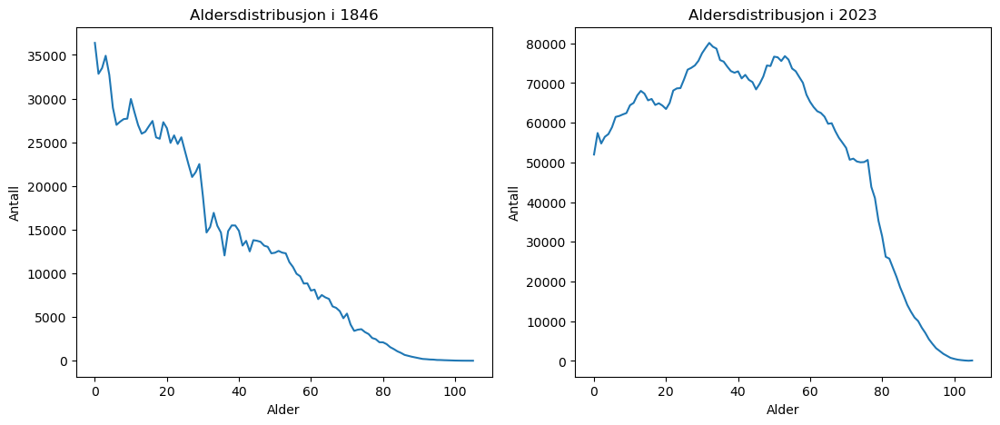

In [6]:
matrise_årstall = matrix_alder.T      ## f(aldersfordeling)|_årstall = antall 

## plotter de ved siden av hverandre for å illustrere forskell i form på kurve 
fig, ax = plt.subplots(1,2, figsize=(13, 5))
ax[0].set_title("Aldersdistribusjon i 1846")
ax[0].plot(alder, matrise_årstall[0])
ax[0].set_xlabel("Alder")
ax[0].set_ylabel("Antall")
#plt.show()

ax[1].set_title("Aldersdistribusjon i 2023")
ax[1].plot(alder, matrise_årstall[-1])
ax[1].set_xlabel("Alder")
ax[1].set_ylabel("Antall")
plt.show()


Fra år 1846 til år 2023 kan vi se at det har vært en endring av aldersdistribusjon i samfunnet. I 1846 har norge en tydelig halvpyramide-form med ganske ung befolkning. I følge den demografiske overgangsmodellen kan vi klassifisere norge i fase 1 eller fase 2 i perioden 1840, se https://no.wikipedia.org/wiki/Den_demografiske_overgangsmodellen og dermed https://snl.no/den_industrielle_revolusjon_i_Norge. Fase 1 og fase 2 kan skilles fra hverandre ved å se på om kurven har en bue (logaritmisk form) eller om heller mer rett strek (lineær). I animasjonen under kan vi se etter mer tydleig skille mellom fase 1 og 2. Se bilde under. Vi kan også prøve å se etter fase 3. Det er ut i fra plottet over til høyre at vi kan se at norge i 2023 har synkende befolkningvekst og er da i fase 4. Dette støttes også av figuren under. 


In [7]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://upload.wikimedia.org/wikipedia/commons/0/0a/Dtm_pyramids.png")

In [8]:
fig, ax = plt.subplots()

x = alder
line, = ax.plot(x, matrise_årstall[-1], label='1846')
L=plt.legend(loc=1)
plt.title("Aldersdistribusjon i perioden 1846-2023")

def animate_årstall(i):
    lab = ''+str(1846 + i)
    line.set_ydata(matrise_årstall[i])  # update the data.
    L.get_texts()[0].set_text(lab) #Update label each at frame
    #print(i)
    return line,


ani = animation.FuncAnimation(
    fig, animate_årstall, interval=1, blit=True, save_count=178)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)
#HTML(ani.to_jshtml())
HTML(ani.to_jshtml())

Vi kan se antydning til fase 1 frem til slutten av 1890. Så begynner vi å se en utflatning og heller en fase 2. Så, pga depreson, krig og nedgangstider så får vi litt svingninger i aldersdistribusjonen. Vi får faktisk vår første eldrebølge fra 1937 som forsvinner et sted på tidlig 2000. Så kommer en ny eldrebølge, eller eldrebølger(?) som fortsetter helt ut i 2023. 

Noe jeg synes er litt intressant er den bølgen som reiser seg i fra år 2005 og til i dag som ser ut til å være en økning i aldersgruppen 20-40 år i perioden. Hva kan dette skyldes? Er det innvandring? Dette er en enkel hypotese vi kan ta en titt på. 

Under er en animasjon mest for gøy. 

In [10]:

fig, ax = plt.subplots()

x = years
line, = ax.plot(x, matrix_alder[0], label='Aldersgruppe: 0 år')
L=plt.legend(loc=1)
plt.title("Utviklingen av aldersgrupper i perioden 1846-2023")
plt.ylim(0,80000)

def animate_aldersfordeling(i):
    lab = 'Aldersgruppe: '+str(0 + i)+' år'
    line.set_ydata(matrix_alder[i])  # update the data.
    L.get_texts()[0].set_text(lab) #Update label each at frame
    #print(i)
    return line,


ani = animation.FuncAnimation(
    fig, animate_aldersfordeling, interval=1, blit=True, save_count=106)

# To save the animation, use e.g.
#
# ani.save("movie.mp4")
#
# or
#
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)
#HTML(ani.to_jshtml())
HTML(ani.to_jshtml())
#plt.show()

Vi laster inn et nytt datasett fa ssb (https://www.ssb.no/statbank/table/05182/tableViewLayout1/) hvor vi ser på innvandrere i perioden 1970 til i dag. Det gjelder da flyktninger og feks arbeidsinnvandrere. 

In [11]:
# Base url 
base_url = "https://www.ssb.no/statbank/sq/10083003"
#Sends a get request for data 
connection = requests.get(base_url)
print(connection.json())

{'dataset': {'dimension': {'Region': {'label': 'region', 'category': {'index': {'30': 0, '03': 1, '34': 2, '38': 3, '42': 4, '11': 5, '46': 6, '15': 7, '50': 8, '18': 9, '54': 10, '21': 11}, 'label': {'30': 'Viken', '03': 'Oslo', '34': 'Innlandet', '38': 'Vestfold og Telemark', '42': 'Agder', '11': 'Rogaland', '46': 'Vestland', '15': 'Møre og Romsdal', '50': 'Trøndelag - Trööndelage', '18': 'Nordland - Nordlánnda', '54': 'Troms og Finnmark - Romsa ja Finnmárku', '21': 'Svalbard'}}, 'link': {'describedby': [{'extension': {'Region': 'urn:ssb:classification:klass:104'}}]}, 'extension': {'show': 'code_value'}}, 'InnvandrKat': {'label': 'innvandringskategori', 'category': {'index': {'2': 0}, 'label': {'2': 'Innvandrere'}}, 'extension': {'show': 'value'}}, 'Tid': {'label': 'år', 'category': {'index': {'1970': 0, '1980': 1, '1986': 2, '1987': 3, '1988': 4, '1989': 5, '1990': 6, '1991': 7, '1992': 8, '1993': 9, '1994': 10, '1995': 11, '1996': 12, '1997': 13, '1998': 14, '1999': 15, '2000': 16,

In [12]:
data = json.loads(connection.text)
df = pd.DataFrame(data)
print(df.head())
print("\n")
print(df["dataset"]["value"])
#df = pd.read_json(connection.json())
values = np.asarray(df["dataset"]["value"])

                                                     dataset
dimension  {'Region': {'label': 'region', 'category': {'i...
extension  {'px': {'infofile': 'None', 'tableid': '05182'...
label      05182: Personer, etter region, innvandringskat...
source                                Statistisk sentralbyrå
updated                                 2023-03-06T07:00:00Z


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 203848, 210021, 220424, 238614, 15981, 25278, 33994, 36614, 40774, 44667, 47063, 49479, 51984, 54695, 56459, 59548, 61875, 64351, 67290, 70301, 73777, 76404, 79049, 84343, 86763, 89523, 93507, 98479, 106102, 116167, 122379, 130133, 139081, 145215, 151722, 158835, 163348, 166357, 168710, 171868, 177455, 176994, 177904, 184251, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 36438, 36344, 37561, 41105, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

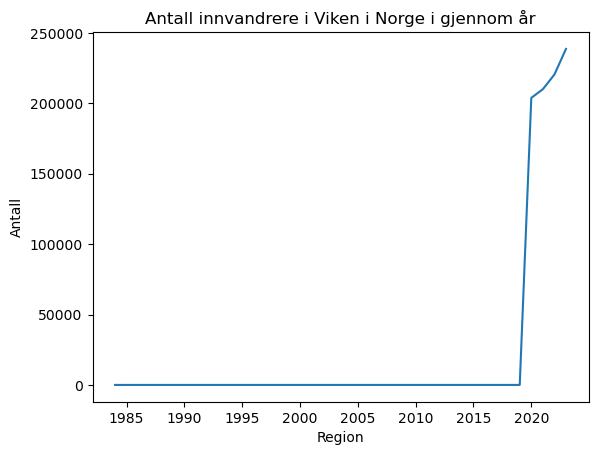

In [14]:
years = np.arange(1984, 2024)
regioner = np.arange(0,12)

matrix_test = np.reshape(values, (12,40)) ##  Hver vektor i matrisen er en region. 

plt.title("Antall innvandrere i Viken i Norge i gjennom år")   
plt.plot(years, matrix_test[0])
plt.xlabel("Region")
plt.ylabel("Antall")
plt.show()

#print(matrix_test[0])

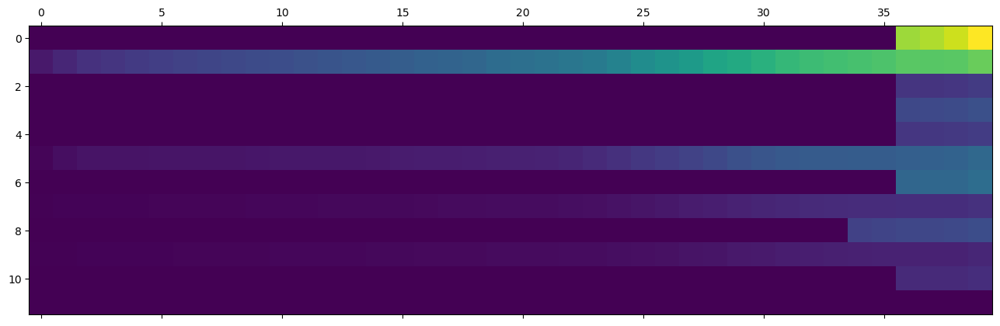

In [15]:
plt.matshow(matrix_test)
plt.show()

[ 21529  37746  50308  53327  58584  64197  67285  69345  72623  76451
  80042  83976  86512  89473  93703  98962 105040 108726 112448 119742
 123957 128396 134672 144518 159708 177763 191399 207821 225006 242065
 256940 270986 279700 285589 336540 343267 790497 800094 819356 877227]
37


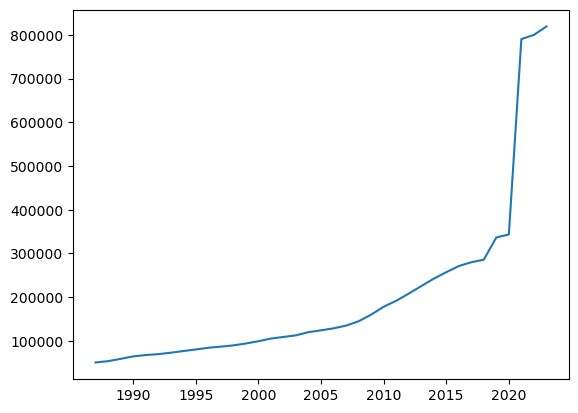

In [16]:
innvandring_år = np.sum(matrix_test, axis=0)
print(innvandring_år)
innvandring_år = innvandring_år[2:-1]  #kutter av de to første verdiene i fra år 1970 og 1980 før vi begynner å telle hvert år fra 1986
years = np.arange(1987, 2024)
print(len(innvandring_år))
plt.plot(years, innvandring_år)
plt.show()

Det kan se ut som at fylkessammenslåingen tukler litt med hvor enkelt det er å bruke dataen fra denne tabellen. Viken startet i eksistere i 2020 og flere andre fylker blir oprettet og fjernet. I steden for å måtte holde oversikt over oprettelse og nedleggelse av fylker prøver vi oss på et annet datasett. Dette tar for seg innvandrere i ulike aldersgrupper og i perioder. Litt klønete å jobbe med, men vi forsøker oss. https://www.ssb.no/statbank/table/06313/tableViewLayout1/

In [17]:
# Base url 
base_url = "https://www.ssb.no/statbank/sq/10083005"
#Sends a get request for data 
connection = requests.get(base_url)
print(connection.json())

data = json.loads(connection.text)
df = pd.DataFrame(data)
print(df.head())
print("\n")
print(df["dataset"]["value"])
#df = pd.read_json(connection.json())
values = np.asarray(df["dataset"]["value"])

matrix_test2 = np.reshape(values, (6,11)) ##  Hver vektor i matrisen er en region. 

{'dataset': {'dimension': {'Alder': {'label': 'alder', 'category': {'index': {'00-17': 0, '18-29': 1, '30-59': 2, '60-79': 3, '80+': 4, 'UOPP': 5}, 'label': {'00-17': '0-17 år', '18-29': '18-29 år', '30-59': '30-59 år', '60-79': '60-79 år', '80+': '80 år eller eldre', 'UOPP': 'Uoppgitt alder'}}, 'extension': {'show': 'value'}}, 'ContentsCode': {'label': 'statistikkvariabel', 'category': {'index': {'Personer': 0}, 'label': {'Personer': 'Personer'}, 'unit': {'Personer': {'base': 'antall', 'decimals': 0}}}, 'extension': {'show': 'value'}}, 'Tid': {'label': 'intervall (år)', 'category': {'index': {'1990-2011': 0, '1990-2012': 1, '1990-2013': 2, '1990-2014': 3, '1990-2015': 4, '1990-2016': 5, '1990-2017': 6, '1990-2018': 7, '1990-2019': 8, '1990-2020': 9, '1990-2021': 10}, 'label': {'1990-2011': '1990-2011', '1990-2012': '1990-2012', '1990-2013': '1990-2013', '1990-2014': '1990-2014', '1990-2015': '1990-2015', '1990-2016': '1990-2016', '1990-2017': '1990-2017', '1990-2018': '1990-2018', '19

Denne tabellen er ikke så detaljert som vi gjerne skulle ønsket, men pga tidsbegrensninger ser vi hvor langt vi klarer å komme med denne. Tabellen er på formen under 

|       | 1990-2011 | 1990-2012 | 1990-2013 | ... |
|-------|-----------|-----------|-----------|-----|
| 0-17  |           |           |           |     |
| 18-29 |           |           |           |     |
| 30-59 |           |           |           |     |
| ...   |           |           |           |     |

For å prøve å se på om det har vært en endring i innvandring i disse årene tar vi differansen mellom kolonnene. Dette kan gi oss et innblikk i om det har vært en økning eller ikke, som det kanskje ser ut på animasjonen over at det har vært. 

In [22]:
print(matrix_test2)
print("\n")
#print(matrix_test2[:,0])# for perioden 1990-2011
#ønsker i all hovedsak å se på aldersgruppene 18-29år og 30-59 år som da er rad 1 og 2 
# siden hver kolonne er for 1990-2011,2012,.. osv så tar vi diff mellom kolonnene for å få den relle innvandringen i år 2011-2012 osv 
reell_innvanding_alder = np.zeros((6,10))
#print(reell_innvanding_alder)
#print(len(reell_innvanding_alder))
for i in range(0, len(matrix_test2[0])-1):
    #print(i)
    vec = matrix_test2[:,i +1] - matrix_test2[:,i] 
    #print(vec)
    reell_innvanding_alder[:, i] = vec

[[112887 123180 133117 144412 155206 168214 178729 186455 193881 198358
  205613]
 [213185 236577 259366 279960 299620 319053 334588 348538 362270 371196
  385239]
 [190218 212562 233641 253481 271815 289663 305655 320890 337257 348869
  367078]
 [  8206   8739   9297   9829  10377  10991  11555  12067  12488  12817
   13426]
 [   461    491    522    547    570    610    639    660    693    716
     767]
 [     0      0      0      0      0      0      0      0      0      2
       2]]




In [44]:
gruppe_1 = reell_innvanding_alder[1]
#gruppe_2 = reell_innvanding_alder[2]
b = 0
kummulativ_innvanding_grupp1 = np.cumsum(gruppe_1)  # antar at innvandrerene forblir i norge i hele tidsperioden 

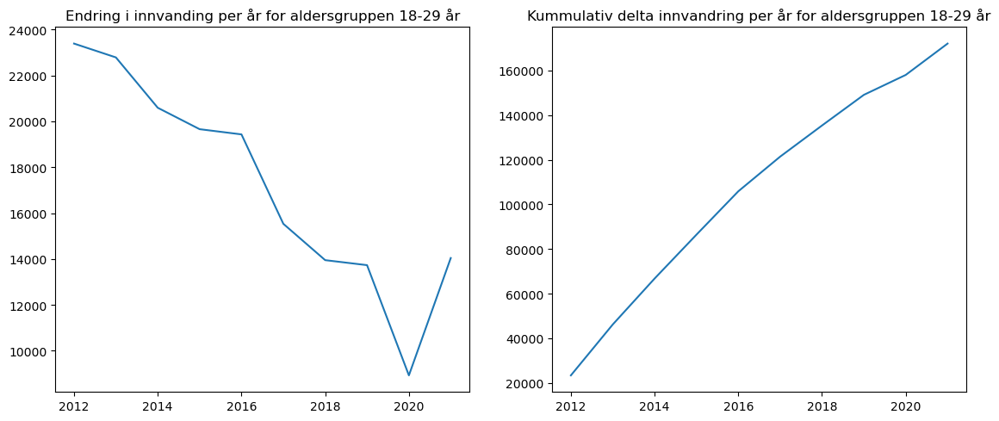

In [45]:
år = np.arange(2012, 2022)
fig, ax = plt.subplots(1,2, figsize=(12, 5))

ax[0].set_title("Endring i innvanding per år for aldersgruppen 18-29 år")
ax[0].plot( år, gruppe_1 )

ax[1].set_title("Kummulativ delta innvandring per år for aldersgruppen 18-29 år")
ax[1].plot( år, kummulativ_innvanding_grupp1 )
plt.tight_layout()
plt.show()

For å kunne sammenligne det første datasettet med tilsynelatende befolkningsvekst i perioden 2005 til i dag for en aldersgruppe 20-40 så må vi gjøre et utrekk fra den matrisen både på tidsperiode og på alderssegment, og vi grupperer (summerer) antallet innvandrere i perioden for 18-29 pr. 

Først gjør vi et utrekk på årstall 2012-2023 for å kunne sammenligne med datasettet over. Vi kan tydelig se igjen bølgene i matriseplottet under. Vi gjør enda en innsnevring på alder, og får den første bølgen i den nederste matriseplottet. 

[[60530 61429 63427 ...    50    37    33]
 [59335 61440 62184 ...    62    35    33]
 [59383 60097 62083 ...    67    35    43]
 ...
 [54827 56012 57881 ...    85    63    73]
 [53134 55225 56142 ...   110    51    98]
 [56458 53674 55550 ...    92    64   102]]


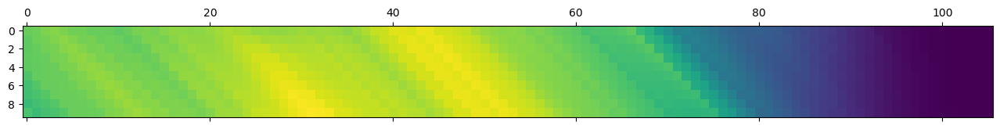

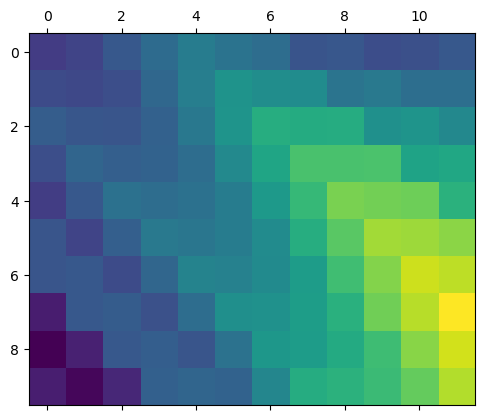

In [46]:
# La oss se på år 2012-2023 i aldersdistribusjon
mat_2012_2023 = matrise_årstall[167:-1]
print(mat_2012_2023)
plt.matshow(mat_2012_2023)
plt.show()

# gjør utrekk på alder 18-29 år 
mat_2012_2023_age = mat_2012_2023[:, 18:30]
plt.matshow(mat_2012_2023_age)
plt.show()


(10, 12)
10


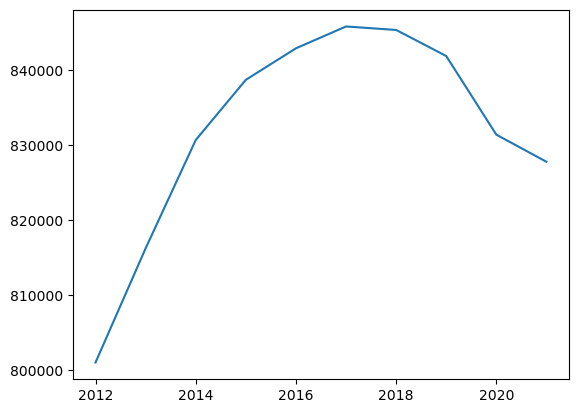

In [47]:
# summerer over aldersgruppen, radsum til matrisen 
vec = np.sum(mat_2012_2023_age, axis=1)

print(mat_2012_2023_age.shape)
print(len(år))
plt.plot(år, vec)
plt.show()


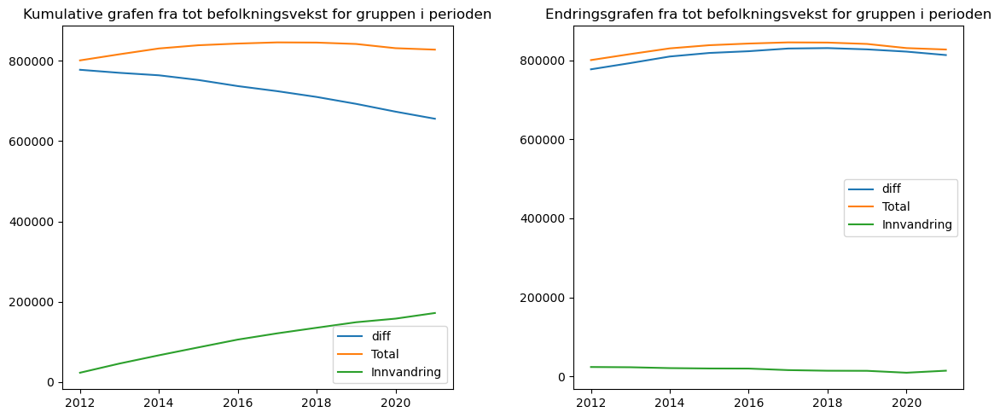

In [50]:
fig, ax = plt.subplots(1,2, figsize=(12, 5))

ax[0].set_title("Kumulative grafen fra tot befolkningsvekst for gruppen i perioden")
ax[0].plot(år, vec-kummulativ_innvanding_grupp1, label = "diff")
ax[0].plot(år, vec, label = "Total")
ax[0].plot(år, kummulativ_innvanding_grupp1, label = "Innvandring")
ax[0].legend()

ax[1].set_title("Endringsgrafen fra tot befolkningsvekst for gruppen i perioden")
ax[1].plot(år, vec-gruppe_1, label = "diff")
ax[1].plot(år, vec, label = "Total")
ax[1].plot(år, gruppe_1, label = "Innvandring")
ax[1].legend()
plt.tight_layout()
plt.show()

44795


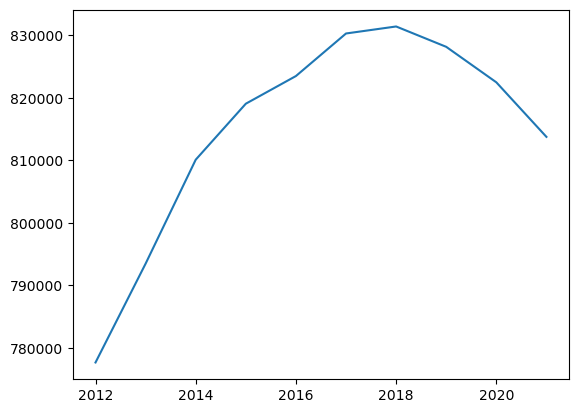

In [51]:
print( max(vec) - vec[0])
plt.plot(år, vec-gruppe_1, label = "diff")
plt.show()


Endringen i innvandring klarer ikke helt å flate ut kurven, men det er kanskje heller ikke å forvente siden det kun er en endring.
Veldig vanskelig å kunne trekke noe konklusjon. Det er bedre å bruke et tilsvaende datasett for innvandring som for befolkning. I tilleg har vi kun endringen i perioden 2012-2023 og ikke starten av veksten i 2005. Her trengs det mer detaljert analyse som jeg desverre ikke får tid til. 